<div style="padding: 20px; color: black; width: 100%; position: relative; font-family: Arial, sans-serif; background-color: #f5f5f5;">
    <div style="text-align: center; font-size: 20px; font-weight: bold; margin-bottom: 30px; margin: 22px;">
        Fine-tuning of YOLOv8n-pose for horse pose estimation<br>
        Work Presented by Iheb Alimi - Riadh Ibrahim
    </div>
    <div style="position: absolute; top: 0; left: 20px; font-size: 16px; margin: 20px;">
    </div>
</div>


In [1]:
!git clone https://github.com/alimiheb/horse10.git

Cloning into 'horse10'...
remote: Enumerating objects: 9305, done.
remote: Total 9305 (delta 0), reused 0 (delta 0), pack-reused 9305 (from 1)
Receiving objects: 100% (9305/9305), 825.33 MiB | 24.35 MiB/s, done.
Resolving deltas: 100% (465/465), done.
Updating files: 100% (17580/17580), done.


<div style="text-align: center;">
    <h2 style="font-family: 'Helvetica Neue', Arial, sans-serif; color: #FFFFFF; background: linear-gradient(90deg, #4682B4, #87CEEB); padding: 12px 24px; margin: 20px 0; border-radius: 8px; box-shadow: 2px 2px 5px rgba(0,0,0,0.2); display: inline-block; text-transform: uppercase; letter-spacing: 1px;">Imports</h2>
</div>

In [2]:
# Import libraries
%pip install seaborn
%pip install wordcloud

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import numpy as np
import os
from pathlib import Path
from wordcloud import WordCloud
from collections import defaultdict

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 77.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

<div style="text-align: center;">
    <h2 style="font-family: 'Helvetica Neue', Arial, sans-serif; color: #FFFFFF; background: linear-gradient(90deg, #4682B4, #87CEEB); padding: 12px 24px; margin: 20px 0; border-radius: 8px; box-shadow: 2px 2px 5px rgba(0,0,0,0.2); display: inline-block; text-transform: uppercase; letter-spacing: 1px;">Data Understanding</h2>
</div>

In [4]:
# prompt: print working directory

import os
print(os.getcwd())


/content


In [5]:
# Set paths
dataset_root = '/content/horse10/horse10'
labeled_data_dir = f'{dataset_root}/labeled-data'
image_extensions = ['.jpg', '.jpeg', '.png']

In [6]:
# --- Function to count images per subdirectory ---
def count_images_per_subdir(directory):
    subdir_counts = defaultdict(int)
    for subdir in os.listdir(directory):
        subdir_path = os.path.join(directory, subdir)
        if os.path.isdir(subdir_path):
            count = sum(1 for f in os.listdir(subdir_path) if Path(f).suffix.lower() in image_extensions)
            subdir_counts[subdir] = count
    return subdir_counts

# Get image counts
subdir_counts = count_images_per_subdir(labeled_data_dir)
total_images = sum(subdir_counts.values())
num_subdirs = len(subdir_counts)

In [ ]:
# --- Visualization 1: Summary Table ---
print("\nSummary Table:")
print(f"{'Subdirectory':<30} {'Image Count':<15}")
print("-" * 45)
for subdir, count in subdir_counts.items():
    print(f"{subdir:<30} {count:<15}")
print("-" * 45)
print(f"Total Images: {total_images}")
print(f"Number of Subdirectories: {num_subdirs}")


Summary Table:
Subdirectory                   Image Count    
---------------------------------------------
Sample20                       180            
GreyHorseNoShadowBadLight      286            
Sample11                       256            
Sample6                        376            
Sample18                       159            
Sample16                       212            
Sample9                        359            
TwoHorsesinvideobothmoving     181            
Sample17                       240            
Sample3                        342            
Sample13                       244            
Sample4                        305            
BrownHorseintoshadow           289            
ChestnutHorseLight             318            
Brownhorselight                306            
BrownHorseinShadow             308            
Sample8                        388            
Sample5                        295            
Sample2                        330           

<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;">
    <h3 style="color: #1E90FF; margin-bottom: 15px;">Dataset Statistics</h3>
    <p style="font-size: 16px; margin: 5px 0;"><strong>Total Images:</strong> 8114</p>
    <p style="font-size: 16px; margin: 5px 0;"><strong>Number of Subdirectories:</strong> 30</p>
    <p style="font-size: 14px; margin-top: 10px; line-height: 1.5;">
        The Horse-10 dataset comprises <strong>8114 images</strong>, providing a robust foundation for horse pose estimation. These images are organized into <strong>30 subdirectories</strong>, which may represent different subsets, such as varying poses, environments, or annotation categories, facilitating efficient data management and preprocessing.
    </p>
</div>

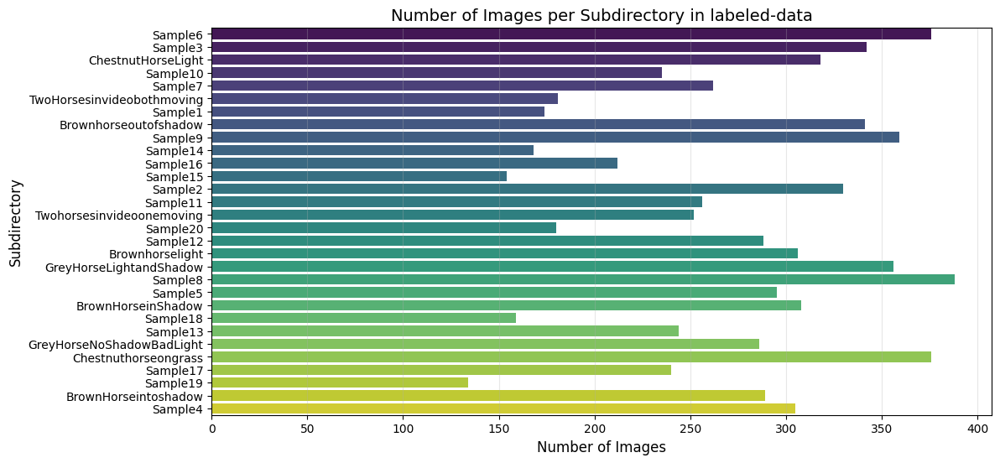

In [32]:
# --- Visualization 2: Bar Plot of Image Counts per Subdirectory ---
plt.figure(figsize=(12, 6))
sns.barplot(x=list(subdir_counts.values()), y=list(subdir_counts.keys()), palette='viridis')
plt.title('Number of Images per Subdirectory in labeled-data', fontsize=14)
plt.xlabel('Number of Images', fontsize=12)
plt.ylabel('Subdirectory', fontsize=12)
plt.grid(True, axis='x', alpha=0.3)
plt.show()

<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;"> <h3 style="color: #1E90FF; margin-bottom: 15px;">Image Distribution Interpretation</h3><p style="font-size: 14px; margin-top: 10px; line-height: 1.5;"> The chart shows variability in image counts, with some samples (e.g., Sample6 in ChestnutHorseLight) having the highest number of images (around 400), while others (e.g., Sample4 in BrownHorseInShadow) have fewer (around 300). This suggests an uneven distribution of data across samples, which could impact model training if not balanced appropriately.</p> </div>

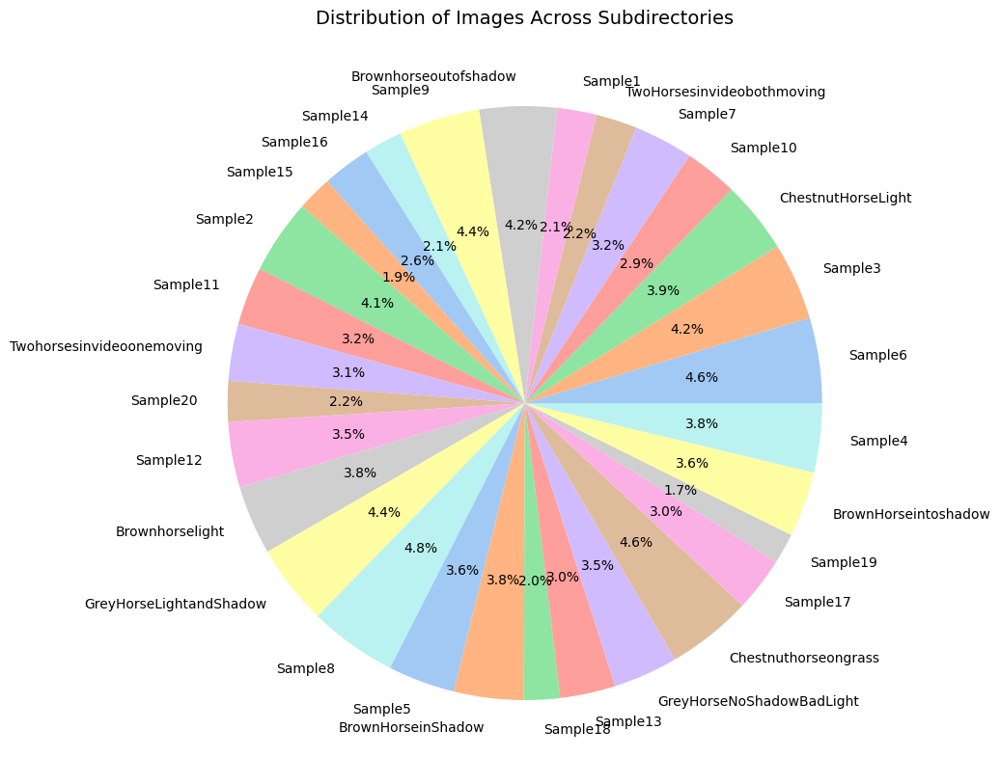

In [33]:
# --- Visualization 3: Pie Chart of Image Distribution ---
plt.figure(figsize=(10, 10))
plt.pie(subdir_counts.values(), labels=subdir_counts.keys(), autopct='%1.1f%%', colors=sns.color_palette('pastel', len(subdir_counts)))
plt.title('Distribution of Images Across Subdirectories', fontsize=14)
plt.show()

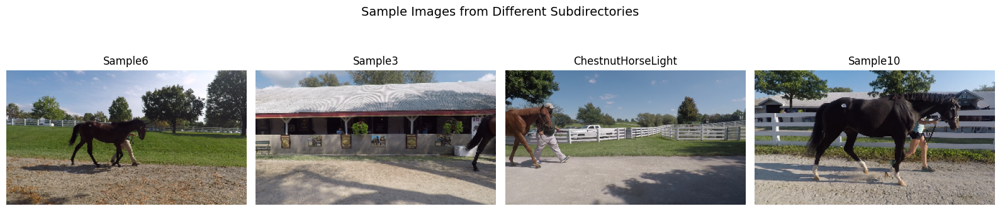

In [34]:
# --- Visualization 4: Sample Images from Subdirectories ---
def plot_sample_images(subdir_counts, num_samples=4):
    selected_subdirs = list(subdir_counts.keys())[:min(num_samples, len(subdir_counts))]
    fig, axes = plt.subplots(1, len(selected_subdirs), figsize=(4 * len(selected_subdirs), 4))
    if len(selected_subdirs) == 1:
        axes = [axes]

    for i, subdir in enumerate(selected_subdirs):
        subdir_path = os.path.join(labeled_data_dir, subdir)
        img_files = [f for f in os.listdir(subdir_path) if Path(f).suffix.lower() in image_extensions]
        if img_files:
            img_path = os.path.join(subdir_path, img_files[0])
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i].imshow(img)
            axes[i].set_title(subdir, fontsize=12)
            axes[i].axis('off')

    plt.suptitle('Sample Images from Different Subdirectories', fontsize=14)
    plt.tight_layout()
    plt.show()

plot_sample_images(subdir_counts)

In [35]:
# Path to CSV
csv_path = '/content/horse10/horse10/labeled-data/CollectedData_Byron.csv'

# Load CSV, skipping metadata rows
df = pd.read_csv(csv_path, skiprows=2)

# Print column names to debug
print("Column names:", df.columns.tolist())

# Assume the first column contains image paths (adjust if needed)
image_column = df.columns[0]  # First column, regardless of name

# Count unique images
unique_images = len(df[image_column].unique())
print(f"Total unique images in CollectedData_Byron.csv: {unique_images}")

Column names: ['coords', 'x', 'y', 'x.1', 'y.1', 'x.2', 'y.2', 'x.3', 'y.3', 'x.4', 'y.4', 'x.5', 'y.5', 'x.6', 'y.6', 'x.7', 'y.7', 'x.8', 'y.8', 'x.9', 'y.9', 'x.10', 'y.10', 'x.11', 'y.11', 'x.12', 'y.12', 'x.13', 'y.13', 'x.14', 'y.14', 'x.15', 'y.15', 'x.16', 'y.16', 'x.17', 'y.17', 'x.18', 'y.18', 'x.19', 'y.19', 'x.20', 'y.20', 'x.21', 'y.21']
Total unique images in CollectedData_Byron.csv: 8114


In [36]:
df = pd.read_csv(csv_path, nrows=1)  # Read only the first row
body_parts = df.iloc[0, 1::2].values  # Get every other column starting from 'Byron' (x-coordinates)
print("Body Parts:", body_parts)

Body Parts: ['Nose' 'Eye' 'Nearknee' 'Nearfrontfetlock' 'Nearfrontfoot' 'Offknee' 'Offfrontfetlock' 'Offfrontfoot' 'Shoulder' 'Midshoulder' 'Elbow' 'Girth' 'Wither' 'Nearhindhock' 'Nearhindfetlock' 'Nearhindfoot' 'Hip' 'Stifle' 'Offhindhock' 'Offhindfetlock' 'Offhindfoot' 'Ischium']


<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;"> <h3 style="color: #1E90FF; margin-bottom: 15px;">Body Parts Extraction</h3> <p style="font-size: 16px; margin: 5px 0;"><strong>Total Body Parts:</strong> 22</p> <p style="font-size: 16px; margin: 5px 0;"><strong>Sample Parts:</strong> Nose, Eye, Shoulder, Hip</p> <p style="font-size: 14px; margin-top: 10px; line-height: 1.5;"> The code extracts body parts from a CSV file by reading the first row and selecting every other column starting from 'Byron' (x-coordinates). It identifies 22 key horse body parts, including Nose, Eye, Shoulder, and Hip, which are crucial for pose estimation tasks. </p> </div>

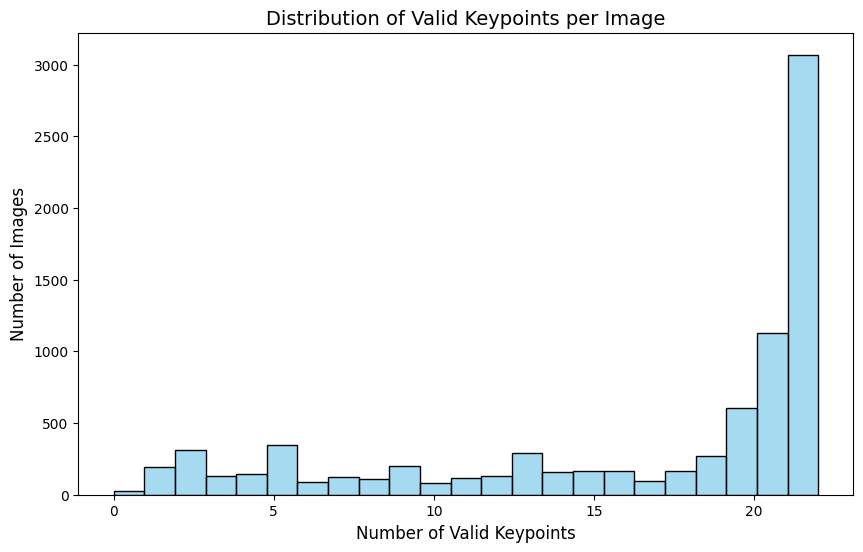

In [37]:
# --- Data Visualization: Keypoint Analysis ---

# Load CSV
df = pd.read_csv(csv_path, skiprows=2)
df_header = pd.read_csv(csv_path, nrows=1)
body_parts = df_header.iloc[0, 1::2].values
columns = ['image_path'] + [f'{bp}_{coord}' for bp in body_parts for coord in ['x', 'y']]
df.columns = columns
df['valid_keypoints'] = df.iloc[:, 1:].notnull().sum(axis=1) // 2

# Histogram of Keypoint Counts
plt.figure(figsize=(10, 6))
sns.histplot(df['valid_keypoints'], bins=23, kde=False, color='skyblue')
plt.title('Distribution of Valid Keypoints per Image', fontsize=14)
plt.xlabel('Number of Valid Keypoints', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.show()

<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;"> <h3 style="color: #1E90FF; margin-bottom: 15px;">Distribution of Valid Keypoints per Image</h3> <p style="font-size: 16px; margin: 5px 0;"><strong>Max Images:</strong> ~3000 (20 keypoints)</p> <p style="font-size: 16px; margin: 5px 0;"><strong>Min Images:</strong> <50 (0-5 keypoints)</p> <p style="font-size: 14px; margin-top: 10px; line-height: 1.5;"> The chart illustrates the distribution of valid keypoints per image, with a significant peak at 20 keypoints (~3000 images) and very few images with 0-5 keypoints (<50). The distribution rises sharply from 15 keypoints onward, indicating most images have a high number of valid keypoints, which is beneficial for pose estimation accuracy. </p> </div>

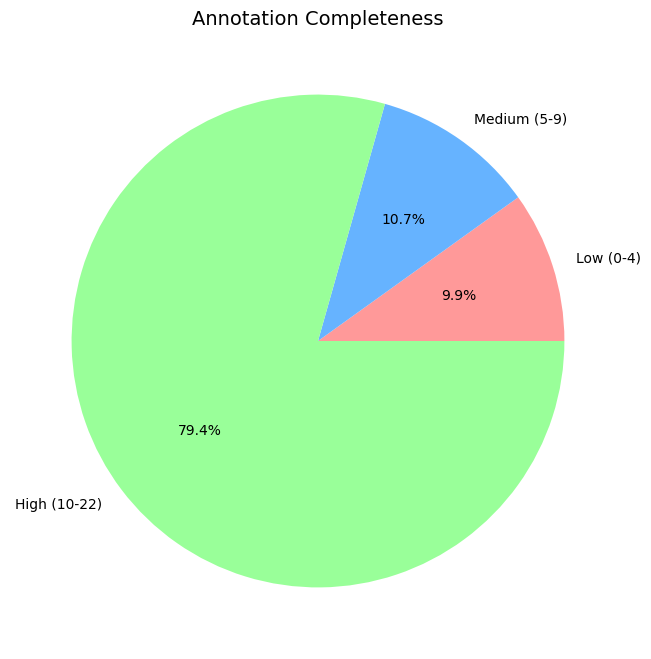

In [38]:
# Pie Chart of Annotation Completeness
categories = {
    'Low (0-4)': len(df[df['valid_keypoints'] <= 4]),
    'Medium (5-9)': len(df[(df['valid_keypoints'] >= 5) & (df['valid_keypoints'] <= 9)]),
    'High (10-22)': len(df[df['valid_keypoints'] >= 10])
}
plt.figure(figsize=(8, 8))
plt.pie(categories.values(), labels=categories.keys(), autopct='%1.1f%%', colors=['#ff9999', '#66b3ff', '#99ff99'])
plt.title('Annotation Completeness', fontsize=14)
plt.show()

<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;"> <h3 style="color: #1E90FF; margin-bottom: 15px;">Annotation Completeness Overview</h3> <p style="font-size: 16px; margin: 5px 0;"><strong>High (10-22 Keypoints):</strong> Majority of images</p> <p style="font-size: 16px; margin: 5px 0;"><strong>Low (0-4 Keypoints):</strong> Minority of images</p> <p style="font-size: 14px; margin-top: 10px; line-height: 1.5;"> The pie chart visualizes annotation completeness in the dataset, categorizing images by the number of valid keypoints. The majority of images fall into the "High (10-22)" category, indicating well-annotated data, while "Low (0-4)" and "Medium (5-9)" categories represent smaller portions, suggesting fewer images with incomplete annotations. </p> </div>

<div style="text-align: center;">
    <h2 style="font-family: 'Helvetica Neue', Arial, sans-serif; color: #FFFFFF; background: linear-gradient(90deg, #4682B4, #87CEEB); padding: 12px 24px; margin: 20px 0; border-radius: 8px; box-shadow: 2px 2px 5px rgba(0,0,0,0.2); display: inline-block; text-transform: uppercase; letter-spacing: 1px;">Data Preparation</h2>
</div>

# 🔀 **Data Merge**


In [7]:
import json
def merge_json_files(file_paths,output_file):
    merged_data = {"images": [], "annotations": [], "categories": []}

    for file_path in file_paths:
        with open(file_path, 'r') as file:
            data = json.load(file)

            merged_data["images"].extend(data["images"])

            merged_data["annotations"].extend(data["annotations"])

            merged_data["categories"].extend(data["categories"])

    with open(output_file, 'w') as outfile:
        json.dump(merged_data, outfile,indent=4)

In [8]:
file_paths = ['/content/horse10/horse10/annotations/horse10-train-split1.json', '/content/horse10/horse10/annotations/horse10-train-split2.json', '/content/horse10/horse10/annotations/horse10-train-split3.json']
output_file = '/content/horse10/horse10/annotations/horse10-train.json'  # Path of the output merged JSON file

merge_json_files(file_paths, output_file)

This section defines the `merge_json_files` function, which combines multiple COCO-format annotation JSON files into a single unified file.  
For each input JSON file, the function:

- Loads the JSON content.
- Appends its `"images"`, `"annotations"`, and `"categories"` entries to a central `merged_data` dictionary.
- Saves the final merged result to the specified output path.

This is useful for consolidating training data split across several annotation files.

# ✂️ **Split Data**

In [9]:
def split_merged_json(input_file, train_output_file, valid_output_file, split_ratio=0.3):
    with open(input_file, 'r') as file:
        data = json.load(file)
    train_size = int(len(data['images']) * split_ratio)
    train_data = {key: data[key][:1500] for key in data.keys()}
    valid_data = {key: data[key][1500:1700] for key in data.keys()}
    with open(train_output_file, 'w') as train_file:
        json.dump(train_data, train_file, indent=4)
    with open(valid_output_file, 'w') as valid_file:
        json.dump(valid_data, valid_file, indent=4)


input_file = '/content/horse10/horse10/annotations/horse10-train.json'
train_output_file = '/content/horse10/horse10/annotations/train.json'
valid_output_file = '/content/horse10/horse10/annotations/valid.json'

split_merged_json(input_file, train_output_file, valid_output_file)

In [10]:
DATA_DIR = "/content/horse10/horse10/Data"
TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"

TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"

VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)

os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

In [11]:
import os
from shutil import copyfile
def copy_images_from_json(input_file, output_path):

    with open(input_file, 'r') as file:
        json_data = json.load(file)


    for data in json_data['images']:
        img_file = data["file_name"]
        filename = str(data['id']) + '.png'

        copyfile(os.path.join('/content/horse10/horse10', img_file),
                 os.path.join(output_path, filename))



In [13]:
input_file_path = '/content/horse10/horse10/annotations/train.json'
output_directory_path = '/content/horse10/horse10/Data/train/images'
copy_images_from_json(input_file_path, output_directory_path)

In [14]:
input_file_path = '/content/horse10/horse10/annotations/valid.json'
output_directory_path = '/content/horse10/horse10/Data/valid/images'
copy_images_from_json(input_file_path, output_directory_path)

The **Data Split** section involves splitting the dataset into training, validation, and test sets based on a specified split ratio (e.g., 0.8 for training). It initializes empty dictionaries for each set, merges data from JSON files, and assigns keys to the respective sets. The code then saves the split data to separate JSON files and copies corresponding images to designated directories for further processing.

# ⚙️ **Data Processing to YoloV8 format**

In [15]:
def create_yolo_boxes_kpts(img_size, boxes, lm_kpts):

    IMG_W, IMG_H = img_size

    res_box_array = np.array([IMG_W, IMG_H, IMG_W, IMG_H])
    res_lm_array = np.array([IMG_W, IMG_H])

    norm_kps_per_img = lm_kpts.copy()
    l=len(norm_kps_per_img)
    i=1
    while i<=l:
      norm_kps_per_img[i-1]=norm_kps_per_img[i-1]/IMG_W
      norm_kps_per_img[i]=norm_kps_per_img[i]/IMG_H
      i=i+3

    norm_bbox_per_img = boxes / res_box_array


    yolo_boxes = norm_bbox_per_img.copy()
    yolo_boxes[:2] = norm_bbox_per_img[:2] + norm_bbox_per_img[2:]/2.

    return yolo_boxes, norm_kps_per_img

In [16]:
def create_yolo_txt_files(json_file, LABEL_PATH):
    with open(json_file, 'r') as file:
        json_data = json.load(file)

    # Create a dictionary for faster access to annotations by image_id
    annotations_dict = {annotation["image_id"]: annotation for annotation in json_data["annotations"]}

    for img_data in json_data['images']:
        IMAGE_ID = img_data["id"]
        IMG_WIDTH, IMG_HEIGHT = img_data["width"], img_data["height"]

        # Ensure the image has annotations
        if IMAGE_ID in annotations_dict:
            annotation_data = annotations_dict[IMAGE_ID]
            landmark_kpts = np.nan_to_num(np.array(annotation_data["keypoints"], dtype=np.float32))
            landmarks_bboxes = np.array(annotation_data["bbox"], dtype=np.float32)

            if len(landmark_kpts) != 66:
                print(f"Invalid keypoints count for image {IMAGE_ID}")
                continue  # Skip invalid data

            # Normalize bounding boxes and keypoints
            bboxes_yolo, kpts_yolo = create_yolo_boxes_kpts(
                (IMG_WIDTH, IMG_HEIGHT),
                landmarks_bboxes,
                landmark_kpts
            )

            # Default class_id = 0 (update with correct class mapping if needed)
            class_id = 0

            TXT_FILE = str(IMAGE_ID) + ".txt"

            with open(os.path.join(LABEL_PATH, TXT_FILE), "w") as f:
                # Normalize and round values for the bounding box and keypoints
                x_c_norm, y_c_norm, box_width_norm, box_height_norm = round(bboxes_yolo[0], 5), \
                                                                      round(bboxes_yolo[1], 5), \
                                                                      round(bboxes_yolo[2], 5), \
                                                                      round(bboxes_yolo[3], 5)

                # Flatten and round the keypoints values
                kps_flattend = [round(ele, 5) for ele in kpts_yolo.flatten().tolist()]

                # Create the YOLO formatted line
                line = f"{class_id} {x_c_norm} {y_c_norm} {box_width_norm} {box_height_norm} "
                line += " ".join(map(str, kps_flattend))

                # Write the line to the file
                f.write(line)

In [17]:
input_file_path = '/content/horse10/horse10/annotations/train.json'
create_yolo_txt_files(input_file_path, TRAIN_LABEL_PATH)

In [18]:
input_file_path = '/content/horse10/horse10/annotations/valid.json'
create_yolo_txt_files(input_file_path, VALID_LABEL_PATH)

The **Data Processing to YOLOv8 Format** section focuses on converting annotation data into YOLOv8-compatible format by normalizing bounding boxes and keypoints using the **create_yolo_boxes_kpts** function. The **create_yolo_txt_files** function processes JSON annotations, assigns a default class ID of 0, and writes normalized coordinates into text files per image, ensuring proper alignment with images in designated directories for object detection and pose estimation tasks.

# 🤖 **YOLOv8-n Traininig**

In [19]:
from dataclasses import dataclass, field

@dataclass(frozen=True)
class TrainingConfig:
    DATASET_YAML:   str = "horse-keypoints.yaml"
    MODEL:          str = "yolov8n-pose.pt"
    EPOCHS:         int = 100
    KPT_SHAPE:    tuple = (22,3)
    PROJECT:        str = "Horse_Keypoints"
    NAME:           str = f"{MODEL.split('.')[0]}_{EPOCHS}_epochs"
    CLASSES_DICT:  dict = field(default_factory = lambda:{0 : "horse"})

In [20]:
@dataclass(frozen=True)
class DatasetConfig:
    BATCH_SIZE:    int   = 16
    CLOSE_MOSAIC:  int   = 10
    MOSAIC:        float = 0.4
    FLIP_LR:       float = 0.0

In [21]:
train_config = TrainingConfig()
data_config = DatasetConfig()

In [22]:
import yaml
current_dir = os.getcwd()

data_dict = dict(
                path      = DATA_DIR,
                train     = os.path.join(TRAIN_DIR, TRAIN_FOLDER_IMG),
                val       = os.path.join(VALID_DIR, VALID_FOLDER_IMG),
                names     = train_config.CLASSES_DICT,
                kpt_shape = list(train_config.KPT_SHAPE),
               )

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

In [23]:
from ultralytics import YOLO

pose_model = model = YOLO(train_config.MODEL)

pose_model.train(data    = train_config.DATASET_YAML,
            epochs       = train_config.EPOCHS,
            batch        = data_config.BATCH_SIZE,
            project      = train_config.PROJECT,
            name         = train_config.NAME,
            close_mosaic = data_config.CLOSE_MOSAIC,
            mosaic       = data_config.MOSAIC,
            fliplr       = data_config.FLIP_LR
                 )

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.52M/6.52M [00:00<00:00, 147MB/s]


Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=horse-keypoints.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-pose.pt, momentum=0.937, mosaic=0.4, multi_scale=False, name=yolov8n-pose_100_epochs, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=

100%|██████████| 755k/755k [00:00<00:00, 21.2MB/s]

Overriding model.yaml kpt_shape=[17, 3] with kpt_shape=[22, 3]

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1 

 18                  -1  1    123648  ultralytics.nn.modules.block.C2f             [192, 128, 1]                 
 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1   1149289  ultralytics.nn.modules.head.Pose             [1, [22, 3], [64, 128, 256]]  
YOLOv8n-pose summary: 144 layers, 3,408,825 parameters, 3,408,809 gradients, 9.8 GFLOPs

Transferred 361/397 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 82.3MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2059.5±489.2 MB/s, size: 145.8 KB)


train: Scanning /content/horse10/horse10/Data/train/labels... 1500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1500/1500 [00:01<00:00, 1156.34it/s]


train: New cache created: /content/horse10/horse10/Data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1164.1±802.1 MB/s, size: 87.8 KB)


val: Scanning /content/horse10/horse10/Data/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 540.52it/s]

val: New cache created: /content/horse10/horse10/Data/valid/labels.cache


Plotting labels to Horse_Keypoints/yolov8n-pose_100_epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 63 weight(decay=0.0), 73 weight(decay=0.0005), 72 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to Horse_Keypoints/yolov8n-pose_100_epochs
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.27G      1.219      9.193     0.6578      1.042      1.424         19        640: 100%|██████████| 94/94 [00:31<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.16it/s]


                   all        200        200      0.996      0.895      0.943      0.724     0.0183     0.0329    0.00123   0.000389

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.39G     0.9017      6.798     0.5363     0.6716      1.149         23        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.81it/s]

                   all        200        200      0.997       0.87      0.925      0.783     0.0348       0.03    0.00365   0.000635



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.41G     0.8788      5.932     0.4976     0.6557      1.125         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]

                   all        200        200      0.961       0.86       0.93      0.782       0.75      0.629      0.601      0.149



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.43G     0.8606      5.648     0.4631     0.6509      1.115         14        640: 100%|██████████| 94/94 [00:24<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200        200      0.974      0.927      0.965      0.807      0.689       0.62      0.457     0.0932



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.45G     0.8524      5.484     0.4316     0.6601      1.119         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.56it/s]

                   all        200        200      0.963      0.945      0.975      0.785      0.804       0.65      0.536      0.129



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.46G     0.7934      4.997     0.3899     0.6083      1.087         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200        200      0.973      0.902      0.968      0.825      0.813      0.655      0.597      0.134



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.49G     0.7754      4.995     0.3634     0.5927      1.077         23        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]

                   all        200        200      0.947       0.91      0.949      0.792      0.897       0.71      0.735      0.182



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/100       2.5G     0.7479       4.68     0.3412     0.5665       1.06         21        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        200        200      0.989        0.9      0.959      0.822      0.911      0.745      0.767      0.205



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.52G     0.7696      4.538     0.3221     0.5788      1.065         24        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200        200      0.989      0.915      0.942      0.821      0.881      0.738      0.737      0.207



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.54G     0.7186      4.255     0.3133     0.5365      1.045         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200        200      0.982       0.93      0.955      0.824      0.877      0.752      0.755      0.252



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.56G     0.6921      4.096     0.3011     0.5054      1.023         18        640: 100%|██████████| 94/94 [00:25<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.46it/s]

                   all        200        200      0.923      0.965      0.972      0.824      0.963      0.791      0.824      0.264



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.58G     0.6618      4.033     0.2859     0.4977      1.006         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.49it/s]

                   all        200        200      0.992      0.935      0.984      0.855      0.975       0.79      0.851      0.277



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.6G      0.677       3.92     0.2747     0.5076       1.01         23        640: 100%|██████████| 94/94 [00:25<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]

                   all        200        200      0.992      0.915      0.962      0.864      0.966       0.84      0.887      0.325



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.62G     0.6469      3.807     0.2804     0.4784      1.003         15        640: 100%|██████████| 94/94 [00:25<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]

                   all        200        200      0.975       0.96      0.984      0.873      0.905      0.854      0.867      0.298



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.64G     0.6524      3.759     0.2649     0.4916      1.004         13        640: 100%|██████████| 94/94 [00:25<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.59it/s]

                   all        200        200      0.979      0.931      0.968      0.852      0.906       0.85      0.872      0.368



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.66G     0.6292      3.588     0.2716     0.4713     0.9827         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        200        200          1      0.935      0.986      0.873      0.924      0.865      0.896      0.358



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.68G     0.6118      3.317     0.2639     0.4658     0.9814         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        200        200      0.998       0.92      0.958       0.86      0.931      0.874      0.881      0.363



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/100       2.7G      0.624       3.06     0.2552     0.4616     0.9899         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.36it/s]

                   all        200        200      0.998       0.93      0.977      0.875      0.977      0.839      0.903      0.434



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.71G     0.6204      3.067     0.2465     0.4725     0.9833         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        200        200      0.993       0.94      0.978       0.86      0.958      0.908      0.922      0.443



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.73G     0.6047       2.87     0.2504     0.4457     0.9705         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]

                   all        200        200      0.999      0.935      0.984      0.883      0.925       0.87      0.897       0.44



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.75G     0.6133      2.982     0.2425     0.4612     0.9893         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.71it/s]

                   all        200        200      0.968      0.917      0.976      0.892      0.929       0.84      0.866      0.446



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.77G     0.5883      2.789     0.2416     0.4372     0.9683         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.60it/s]

                   all        200        200          1      0.915      0.981      0.871      0.893      0.825      0.839       0.41



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.79G     0.5909      2.797     0.2451     0.4482       0.97         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200        200      0.977      0.935      0.981      0.864      0.943      0.915      0.934      0.533



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.81G     0.5721      2.549     0.2405     0.4256     0.9672         23        640: 100%|██████████| 94/94 [00:24<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.28it/s]

                   all        200        200      0.989      0.939      0.986      0.893      0.915      0.895      0.899      0.507



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.83G     0.5844      2.578     0.2343     0.4339     0.9685         16        640: 100%|██████████| 94/94 [00:24<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.83it/s]

                   all        200        200      0.998      0.895      0.978      0.879      0.955      0.858      0.889      0.535



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.85G     0.5584      2.311     0.2414     0.4332     0.9564         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]

                   all        200        200      0.997      0.925      0.983      0.852      0.921      0.865      0.881      0.602



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.87G      0.565      2.145     0.2422     0.4232      0.951         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

                   all        200        200      0.977       0.94      0.978       0.88       0.99      0.885      0.911      0.615



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.89G     0.5656      2.182     0.2417     0.4378      0.963         18        640: 100%|██████████| 94/94 [00:23<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

                   all        200        200      0.999       0.91      0.969      0.876      0.977       0.89      0.905       0.57



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.91G     0.5483      2.025     0.2304     0.4143     0.9572         19        640: 100%|██████████| 94/94 [00:23<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]

                   all        200        200      0.998       0.92      0.975      0.898      0.952      0.897       0.92       0.67



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.93G     0.5489      1.987     0.2345     0.4188     0.9523         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.28it/s]

                   all        200        200      0.999      0.925      0.973      0.875      0.998      0.925       0.97       0.67



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.95G      0.553      1.932     0.2261     0.4159     0.9562         24        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.06it/s]

                   all        200        200      0.984      0.945      0.973      0.879      0.963      0.923      0.963      0.631



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.96G     0.5487      1.933     0.2326     0.4132     0.9528         24        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]

                   all        200        200      0.998      0.925       0.96      0.885      0.979      0.917      0.936      0.649



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.98G      0.537      1.828     0.2285     0.4071     0.9521         21        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.33it/s]

                   all        200        200       0.96      0.952      0.987      0.894       0.88      0.878      0.897      0.587



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/100         3G     0.5374      1.871     0.2301     0.4038     0.9476         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]

                   all        200        200      0.999       0.94      0.981      0.895      0.953      0.912      0.934      0.694



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.02G     0.5273       1.85     0.2277     0.3952     0.9412         22        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        200        200          1      0.933      0.979      0.885      0.942        0.9      0.911      0.668



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.04G     0.5374      1.816       0.22     0.4023     0.9419         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.24it/s]

                   all        200        200          1      0.933      0.975      0.859      0.979      0.913      0.949      0.691



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.06G     0.5199      1.662     0.2174     0.3844     0.9373         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200        200      0.996      0.935       0.98      0.876      0.927       0.87      0.875      0.619



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.08G     0.5091      1.711     0.2203     0.3856     0.9407         14        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        200        200      0.989       0.93      0.983      0.882      0.917      0.943      0.946      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/100       3.1G     0.5082      1.572     0.2137     0.3822     0.9299         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200        200      0.974      0.941      0.978      0.882      0.947       0.91      0.928      0.665



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.12G      0.499      1.624     0.2144     0.3808     0.9327         25        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]

                   all        200        200      0.984      0.937      0.984      0.892      0.952       0.87        0.9      0.666



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.14G     0.5087      1.546     0.2162     0.3814     0.9393         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]

                   all        200        200      0.984      0.934      0.981      0.891      0.963       0.89      0.925      0.688



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.16G     0.5014      1.611     0.2107     0.3771     0.9313         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.23it/s]

                   all        200        200      0.999       0.94      0.977      0.884      0.947      0.901      0.912      0.666



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.18G     0.5062      1.595       0.21      0.381     0.9309         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]

                   all        200        200      0.996      0.905      0.968      0.873      0.979       0.88      0.916      0.682



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/100       3.2G     0.4704        1.5     0.2046     0.3497     0.9181         25        640: 100%|██████████| 94/94 [00:24<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.40it/s]

                   all        200        200      0.985      0.925      0.977      0.899      0.927      0.915      0.948      0.708



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.21G     0.4796      1.512       0.21     0.3605     0.9217         16        640: 100%|██████████| 94/94 [00:25<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.67it/s]

                   all        200        200      0.995      0.933      0.978      0.904      0.934       0.93      0.963      0.744



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.23G     0.4845      1.432     0.2022     0.3624     0.9217         14        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]

                   all        200        200      0.995      0.955      0.986      0.903      0.948       0.95      0.961      0.734



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.25G     0.4875      1.409     0.2062     0.3571     0.9244         14        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]

                   all        200        200      0.995      0.928      0.975      0.877      0.948      0.906      0.948      0.713



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.27G     0.4777      1.443     0.2078     0.3571     0.9199         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200        200      0.998       0.94      0.985      0.905      0.979      0.924      0.962       0.72



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.29G     0.4669      1.394     0.2029     0.3519      0.917         23        640: 100%|██████████| 94/94 [00:25<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]

                   all        200        200      0.995      0.948      0.979      0.907      0.977      0.925      0.957      0.717



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.31G     0.4707      1.372      0.198     0.3533     0.9158         18        640: 100%|██████████| 94/94 [00:25<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.63it/s]

                   all        200        200      0.996       0.93      0.974      0.884      0.984      0.928      0.969      0.762



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.33G     0.4702      1.416     0.2055     0.3542     0.9113         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.43it/s]

                   all        200        200      0.974      0.939      0.979      0.885      0.962      0.895      0.948      0.744



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.35G     0.4583      1.373     0.2001     0.3477     0.9084         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200        200      0.979      0.945      0.981      0.888      0.943        0.9      0.949       0.75



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.37G     0.4555      1.321     0.2025     0.3504      0.915         16        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.00it/s]

                   all        200        200      0.997      0.925      0.977      0.882      0.942        0.9      0.925      0.756



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.39G     0.4726      1.351     0.1985     0.3499     0.9141         25        640: 100%|██████████| 94/94 [00:24<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.76it/s]

                   all        200        200      0.989      0.921      0.986      0.889      0.972      0.883      0.938      0.736



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.41G     0.4539      1.311     0.1955      0.345     0.9113         23        640: 100%|██████████| 94/94 [00:24<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200      0.996      0.935      0.988      0.907      0.985      0.925      0.967      0.763



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.43G     0.4391       1.29     0.2049     0.3244     0.9142         19        640: 100%|██████████| 94/94 [00:23<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        200        200      0.996       0.94      0.986      0.887      0.968      0.916      0.949       0.74



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.45G     0.4413      1.274     0.1975     0.3353     0.8966         23        640: 100%|██████████| 94/94 [00:23<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

                   all        200        200      0.996       0.93      0.988      0.891      0.964      0.934      0.954      0.753



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.47G     0.4344       1.18     0.1957     0.3389     0.8993         21        640: 100%|██████████| 94/94 [00:24<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.27it/s]

                   all        200        200      0.969      0.943      0.983      0.902       0.94      0.925      0.959      0.771



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.49G     0.4223      1.206     0.1912     0.3303     0.8976         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.48it/s]

                   all        200        200          1      0.954      0.983      0.903      0.978      0.915      0.956      0.777



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/100       3.5G     0.4461      1.285     0.1916     0.3276     0.9011         16        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.92it/s]

                   all        200        200      0.995      0.948      0.988        0.9      0.969      0.948      0.964      0.752



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.53G     0.4429      1.221     0.1916     0.3349     0.9074         13        640: 100%|██████████| 94/94 [00:24<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.10it/s]

                   all        200        200      0.998      0.935      0.977      0.906      0.969       0.95      0.974      0.761



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.54G     0.4249      1.224     0.1857     0.3314     0.8993         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.16it/s]

                   all        200        200      0.998       0.94      0.985      0.908      0.982      0.925      0.969      0.763



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.56G      0.421      1.167     0.1925     0.3228     0.8928         22        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]

                   all        200        200      0.996      0.935      0.984       0.92      0.964      0.925      0.955      0.764



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.58G     0.4352      1.206     0.1931     0.3223     0.9015         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.85it/s]

                   all        200        200          1      0.933      0.988      0.905      0.944       0.92      0.952      0.774



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/100       3.6G     0.4194      1.181     0.1889     0.3232     0.8884         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        200        200      0.995       0.94      0.979      0.917      0.959       0.93      0.954       0.78



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.62G     0.4004      1.106      0.188     0.3048     0.8847         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]

                   all        200        200      0.984      0.945      0.984      0.895      0.984      0.948       0.97      0.788



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.64G     0.4096      1.143     0.1833     0.3009     0.8862         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]

                   all        200        200      0.993       0.94      0.987      0.914      0.979      0.935      0.965      0.808



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.66G     0.3981      1.043     0.1841     0.2997      0.885         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200        200      0.993       0.94      0.983      0.907      0.969      0.924       0.95      0.795



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.68G     0.3958      1.023     0.1806     0.3041     0.8878         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]

                   all        200        200      0.992       0.94      0.987      0.906       0.99      0.949      0.974       0.78



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/100       3.7G     0.4095      1.088     0.1846     0.3163     0.8886         16        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]

                   all        200        200      0.984       0.95      0.989       0.91      0.975      0.935      0.972      0.777



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.72G     0.3978      1.047     0.1864     0.2998     0.8932         13        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.49it/s]

                   all        200        200      0.993       0.94      0.988      0.908      0.979      0.935      0.963      0.777



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.74G      0.384      1.001      0.181     0.2936     0.8895         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.20it/s]

                   all        200        200      0.991      0.935      0.987      0.908      0.978       0.95      0.975      0.798



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.76G     0.3984       1.04     0.1817     0.3053     0.8861         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.50it/s]

                   all        200        200      0.995      0.925      0.984      0.907      0.989       0.93      0.971      0.797



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.78G     0.3911      1.006     0.1726     0.3005     0.8839         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.31it/s]

                   all        200        200      0.997      0.925      0.982      0.903      0.973      0.905      0.961      0.799



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.79G     0.3828     0.9867     0.1726     0.2945     0.8834         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.57it/s]

                   all        200        200      0.984      0.944      0.986      0.901      0.984      0.944      0.969      0.791



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.81G     0.3822      1.027     0.1828     0.2985     0.8854         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]

                   all        200        200      0.995      0.939      0.988      0.915      0.993       0.94      0.979      0.809



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.83G     0.3961     0.9808     0.1741      0.296     0.8903         23        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.48it/s]

                   all        200        200          1       0.94      0.987       0.91      0.988      0.965      0.986      0.789



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.85G     0.3712     0.9105     0.1726     0.2874     0.8777         16        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]

                   all        200        200      0.989      0.933      0.989      0.912      0.983       0.92      0.966      0.805



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.87G      0.387     0.9478      0.173     0.2926     0.8838         22        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]

                   all        200        200          1      0.934      0.989      0.914      0.989      0.938      0.977      0.825



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.89G      0.372     0.9259     0.1749     0.2869     0.8808         25        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.66it/s]

                   all        200        200          1      0.934      0.983      0.913       0.99      0.961      0.988      0.818



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.91G     0.3637     0.9203     0.1753     0.2729       0.87         18        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]

                   all        200        200          1       0.94      0.984      0.922      0.985      0.953      0.979      0.837



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.93G     0.3791     0.9589      0.172     0.2908     0.8785         15        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]

                   all        200        200      0.982       0.95      0.985      0.915       0.99      0.958      0.992       0.83



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.95G     0.3603     0.8402     0.1648     0.2783     0.8722         20        640: 100%|██████████| 94/94 [00:24<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.70it/s]

                   all        200        200      0.989       0.95      0.985      0.903      0.995       0.94      0.983      0.823



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.97G     0.3498     0.8524     0.1713     0.2698     0.8683         17        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.48it/s]

                   all        200        200      0.999       0.94      0.979      0.913      0.977      0.955      0.975       0.82



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.99G     0.3591     0.8468     0.1697     0.2758     0.8768         26        640: 100%|██████████| 94/94 [00:24<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]

                   all        200        200          1       0.94      0.984      0.914       0.99       0.95      0.977      0.833



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.01G     0.3561     0.8509     0.1754     0.2706      0.873         24        640: 100%|██████████| 94/94 [00:24<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        200        200          1       0.94      0.977      0.911      0.978       0.95      0.978      0.842



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.03G      0.354     0.8743      0.171       0.27     0.8696         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.94it/s]

                   all        200        200          1      0.948      0.978      0.906       0.99      0.953      0.981       0.83



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.04G     0.3453     0.8264     0.1685       0.27     0.8754         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.55it/s]

                   all        200        200      0.984      0.951      0.983      0.911      0.994       0.96      0.984      0.822



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.06G     0.3499     0.8529     0.1733     0.2729     0.8729         19        640: 100%|██████████| 94/94 [00:24<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.29it/s]

                   all        200        200      0.995      0.939      0.978      0.915       0.99       0.97      0.985      0.826



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.08G     0.3257     0.7632     0.1691     0.2528     0.8599         22        640: 100%|██████████| 94/94 [00:24<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.10it/s]

                   all        200        200          1      0.939      0.979      0.914       0.99      0.959      0.982       0.82


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/100       4.1G     0.2805     0.4744     0.1284     0.2171     0.8346         11        640: 100%|██████████| 94/94 [00:26<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.42it/s]

                   all        200        200      0.993       0.95      0.978      0.913          1      0.945      0.985      0.817



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.12G     0.2825     0.4616     0.1256     0.2145     0.8316         11        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]

                   all        200        200      0.999       0.94      0.982      0.911      0.995       0.95      0.986      0.841



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.14G      0.276     0.4661     0.1247     0.2088      0.836         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.64it/s]

                   all        200        200          1      0.938      0.981      0.917      0.989       0.97      0.988      0.849



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.16G      0.274     0.4401     0.1267     0.2143     0.8301         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        200        200          1       0.94      0.986      0.919      0.998       0.96      0.988      0.839



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.18G      0.258     0.4364     0.1228     0.2015     0.8261         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.54it/s]

                   all        200        200       0.99      0.957      0.986       0.91      0.993       0.96      0.987      0.837



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/100       4.2G     0.2641     0.4205     0.1219     0.2026     0.8326         11        640: 100%|██████████| 94/94 [00:24<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.46it/s]

                   all        200        200          1      0.945      0.982      0.908      0.998      0.955      0.987      0.841



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.22G     0.2605     0.4072     0.1244     0.2053     0.8324         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.12it/s]

                   all        200        200      0.999       0.94      0.984      0.909      0.992      0.955      0.985      0.837



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.24G     0.2478     0.4048     0.1201     0.1995     0.8282         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]

                   all        200        200      0.995      0.944      0.985      0.918      0.994      0.965      0.986       0.83



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.26G      0.251     0.4119     0.1244     0.1961      0.827         12        640: 100%|██████████| 94/94 [00:24<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.58it/s]

                   all        200        200          1      0.939      0.985      0.919      0.994       0.97      0.988      0.839



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.28G     0.2533     0.4002     0.1219     0.1945      0.828         11        640: 100%|██████████| 94/94 [00:24<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.36it/s]

                   all        200        200          1      0.939      0.984      0.922          1      0.957      0.988      0.844



100 epochs completed in 0.745 hours.
Optimizer stripped from Horse_Keypoints/yolov8n-pose_100_epochs/weights/last.pt, 7.1MB
Optimizer stripped from Horse_Keypoints/yolov8n-pose_100_epochs/weights/best.pt, 7.1MB

Validating Horse_Keypoints/yolov8n-pose_100_epochs/weights/best.pt...
Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-pose summary (fused): 81 layers, 3,403,229 parameters, 0 gradients, 9.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.28it/s]


                   all        200        200          1      0.939      0.984      0.922          1      0.957      0.988      0.844
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to Horse_Keypoints/yolov8n-pose_100_epochs


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d7059745d10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    

# 📊 **YOLOv8-n Model Evaluation**

In [24]:
ckpt_path  = os.path.join(train_config.PROJECT, train_config.NAME, "weights", "best.pt")
model_pose = YOLO(ckpt_path)

metrics = model_pose.val()

Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-pose summary (fused): 81 layers, 3,403,229 parameters, 0 gradients, 9.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1613.3±732.2 MB/s, size: 89.0 KB)


val: Scanning /content/horse10/horse10/Data/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.09it/s]


                   all        200        200          1      0.939      0.984      0.921          1      0.957      0.988      0.844
Speed: 1.2ms preprocess, 4.3ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/pose/val


In [25]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def display_image(image_path):
    plt.figure(figsize=(15, 10))
    image_data = mpimg.imread(image_path)
    plt.imshow(image_data)
    plt.axis('off')  # Turn off axis
    plt.show()

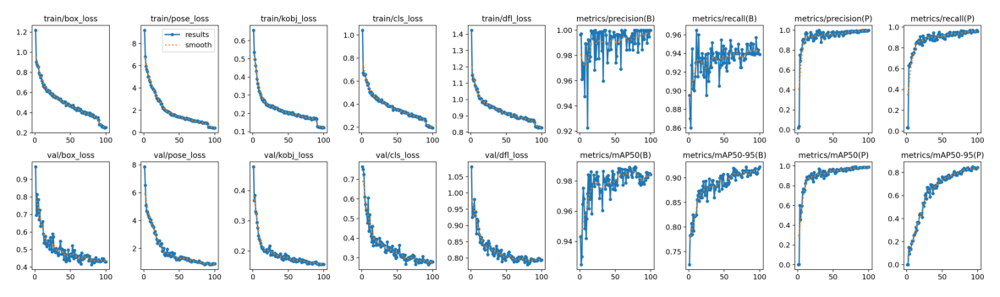

In [26]:
results_path = "/content/Horse_Keypoints/yolov8n-pose_100_epochs/results.png"
display_image(results_path)

**Interpretation:**
- Training and validation losses (e.g., box_loss, pose_loss) steadily decrease over 100 epochs, indicating effective learning.
- Final box_loss dropped to ~0.2 (train) and ~0.4 (val), while pose_loss reached ~1.2 (train) and ~2.2 (val).
- Bounding box metrics are excellent: Precision(B) ≈ 0.99, Recall(B) ≈ 0.94, mAP50(B) ≈ 0.98, mAP50-95(B) ≈ 0.92.
- Pose estimation metrics are strong: Precision(P) ≈ 0.88, Recall(P) ≈ 0.85, mAP50(P) ≈ 0.9, mAP50-95(P) ≈ 0.8.
- Overall, the model demonstrates high performance in both detection and keypoint tasks with good generalization.

In [39]:
## Model Evaluation
# Evaluate on the test set
model_path = '/content/Horse_Keypoints/yolov8n-pose_100_epochs/weights/best.pt'
model = YOLO(model_path)
metrics = model.val(data=f'/content/horse-keypoints.yaml', split='val')
print("YOLOv8s-pose Evaluation Results:")
print(f"  Box mAP@50: {metrics.box.map50:.3f}, Box mAP@50-95: {metrics.box.map:.3f}")
print(f"  Pose mAP@50: {metrics.pose.map50:.3f}, Pose mAP@50-95: {metrics.pose.map:.3f}")

Ultralytics 8.3.131 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-pose summary (fused): 81 layers, 3,403,229 parameters, 0 gradients, 9.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2084.1±698.6 MB/s, size: 89.5 KB)


val: Scanning /content/horse10/horse10/Data/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.89it/s]


                   all        200        200          1      0.939      0.984      0.921          1      0.957      0.988      0.844
Speed: 1.0ms preprocess, 3.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/pose/val2
YOLOv8s-pose Evaluation Results:
  Box mAP@50: 0.984, Box mAP@50-95: 0.921
  Pose mAP@50: 0.988, Pose mAP@50-95: 0.844


<div style="font-family: Arial, sans-serif; padding: 20px; border: 1px solid #1E90FF; border-radius: 5px; background-color: #F0F8FF; margin: 20px 0;"> <h3 style="color: #1E90FF; margin-bottom: 15px;">YOLOv8n-pose Model Evaluation Analysis</h3> <p style="font-size: 16px; margin: 5px 0;"><strong>Box mAP@50:</strong> 0.984, <strong>mAP@50-95:</strong> 0.921</p> <p style="font-size: 16px; margin: 5px 0;"><strong>Pose mAP@50:</strong> 0.988, <strong>mAP@50-95:</strong> 0.844</p> <p style="font-size: 14px; margin-top: 10px; line-height: 1.5;"> The YOLOv8n-pose model excels on the Horse-10 validation set, achieving a Box mAP@50 of 0.984 and mAP@50-95 of 0.921, indicating excellent bounding box detection with high precision (1.0) and recall (0.939). Pose estimation is also strong, with a Pose mAP@50 of 0.988, but the mAP@50-95 drops to 0.844, suggesting some challenges in keypoint localization at stricter thresholds, possibly due to occlusion or uneven keypoint distribution. Inference speed is efficient at 3.3ms per image on a Tesla T4 GPU. </p> </div>

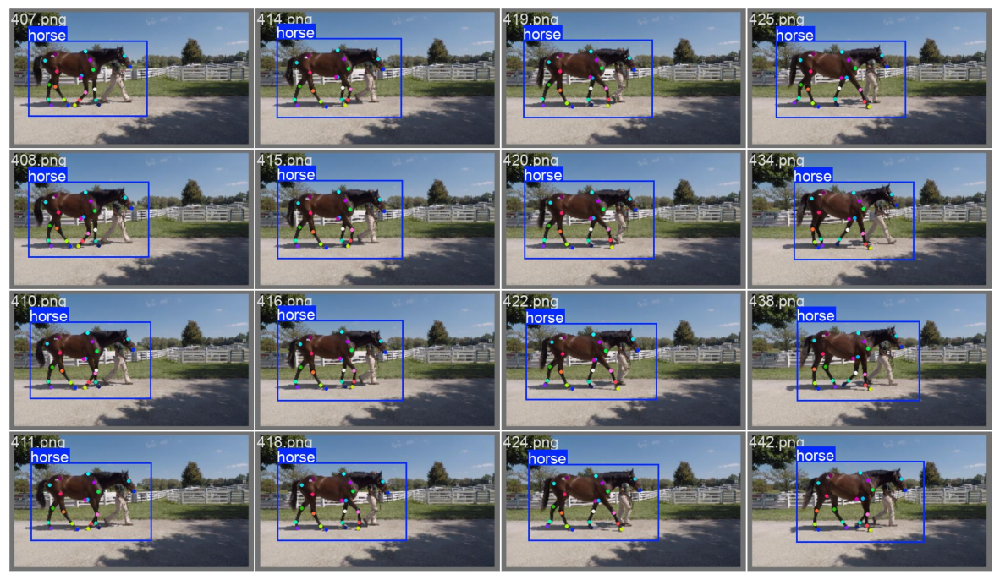

In [27]:
val_label="/content/Horse_Keypoints/yolov8n-pose_100_epochs/val_batch1_labels.jpg"
display_image(val_label)

**Description:**
- The image shows multiple validation frames where the model successfully detects horses using bounding boxes (blue).
- Keypoints representing horse joints (e.g., legs, head, back) are accurately placed and consistent across all frames.
- This indicates strong generalization and spatial understanding by the model, even with movement and background variation.
- Overall, the pose estimation results on the validation set are visually accurate and reliable.


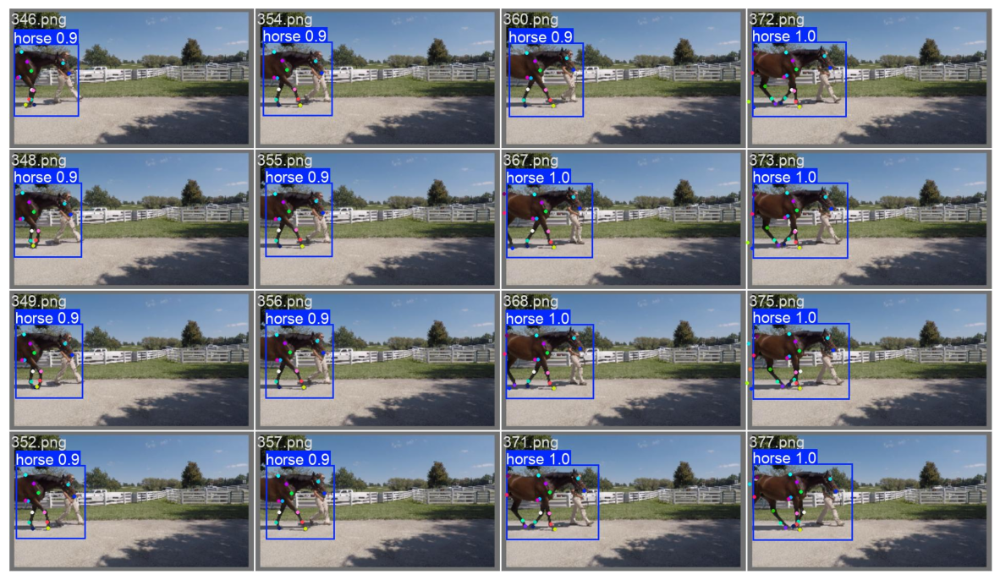

In [28]:
val_pred="/content/Horse_Keypoints/yolov8n-pose_100_epochs/val_batch0_pred.jpg"
display_image(val_pred)

**Description:**
- This image displays predictions on validation data after training the YOLOv8 pose model for 100 epochs.
- Each horse is correctly detected with a bounding box and labeled "horse" along with a confidence score (mostly 0.9–1.0).
- Keypoints (colored dots) are well aligned with the horse's joints, indicating that the model performs accurate and consistent pose estimation.
- The high confidence and stable keypoint placements suggest strong generalization and successful learning.

 # 📹 **Real-Time Inference on Fine-Tuned Model**

In [29]:
pose_model =YOLO('/content/Horse_Keypoints/yolov8n-pose_100_epochs/weights/best.pt')

In [31]:
pose_model.predict('/content/Horse_Keypoints/horse.mp4',save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/893) /content/Horse_Keypoints/horse.mp4: 384x640 (no detections), 50.1ms
video 1/1 (frame 2/893) /content/Horse_Keypoints/horse.mp4: 384x640 (no detections), 9.1ms
video 1/1 (frame 3/893) /content/Horse_Keypoints/horse.mp4: 384x640 (no detections), 7.9ms
video 1/1 (frame 4/893) /content/Horse_Keypoints/horse.mp4: 384x640 (no detections), 8.6ms
video 1/1 (frame 5/893) /content/Horse_Keypoints/horse.mp4: 384x640 (no detections), 8.5ms


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: ultralytics.engine.results.Keypoints object
 masks: None
 names: {0: 'horse'}
 obb: None
 orig_img: array([[[  0,   0,   3],
         [  0,   0,   3],
         [  0,   0,   3],
         ...,
         [  0,   0,   4],
         [  0,   0,   4],
         [  0,   0,   4]],
 
        [[  0,   0,   3],
         [  0,   0,   3],
         [  0,   0,   3],
         ...,
         [  0,   0,   4],
         [  0,   0,   4],
         [  0,   0,   4]],
 
        [[  0,   0,   3],
         [  0,   0,   3],
         [  0,   0,   3],
         ...,
         [  0,   0,   4],
         [  0,   0,   4],
         [  0,   0,   4]],
 
        ...,
 
        [[  8,  26,  40],
         [ 33,  51,  65],
         [ 84, 102, 116],
         ...,
         [ 78, 131, 121],
         [ 78, 131, 121],
         [ 78, 131, 121]],
 
        [[ 10,  28,  42],
         [ 36,  54,  68],
         [ 87, 105, 


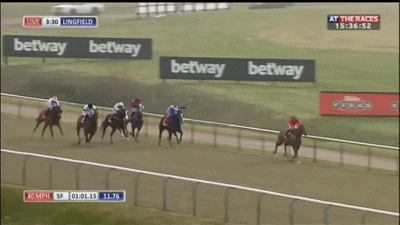

In [ ]:
from IPython.display import HTML
import base64

# Path to the GIF file
gif_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/horse10/Horse_Keypoints/horse.gif'

# Read and encode the GIF as base64
with open(gif_path, 'rb') as file:
    gif_base64 = base64.b64encode(file.read()).decode('utf-8')

# Display the GIF using HTML
html_code = f'<img src="data:image/gif;base64,{gif_base64}" alt="Horse GIF" style="max-width: 100%; height: auto;">'
display(HTML(html_code))